In [50]:
import celloracle as co
from celloracle.applications import Oracle_development_module
import matplotlib.pyplot as plt
import scanpy as sc
import numpy as np
import pandas as pd
import os
from pathlib import Path
import sys

In [2]:
celloracle_obj_simresult_path = "../process/regulation/celloracle/20250107_rna.celloracle.oracle"
gradient_obj_path = "../process/regulation/20250107_celloracle/20250107_gradient_object.celloracle.gradient"


In [4]:
oracle = co.load_hdf5(celloracle_obj_simresult_path)

In [6]:
gradient = co.load_hdf5(gradient_obj_path)

In [25]:
vm = 0.02
scale_simulation = 0.5
scale_dev = 40
cluster_col = "level1_anno"
n_grid = 40
min_mass = 0.011
# visualization settings
%config InlineBackend.figure_format = 'retina'
%matplotlib inline

plt.rcParams['figure.figsize'] = [6, 4.5]
plt.rcParams["savefig.dpi"] = 300
save_folder = "figures"
os.makedirs(save_folder, exist_ok=True)

In [5]:

# Check gene expression
goi = "Grhl1"
oracle.simulate_shift(perturb_condition={goi: 0.0},
                      n_propagation=3)
# Get transition probability
oracle.estimate_transition_prob(n_neighbors=200,
                                knn_random=True,
                                sampled_fraction=1)

# Calculate embedding
oracle.calculate_embedding_shift(sigma_corr=0.05)
dev = Oracle_development_module()
# Load development flow
dev.load_differentiation_reference_data(gradient_object = gradient)
dev.load_perturb_simulation_data(oracle_object = oracle)
# Calculate inner produc scores
dev.calculate_inner_product()
dev.calculate_digitized_ip(n_bins=10)

# Show perturbation scores with perturbation simulation vector field
fig, ax = plt.subplots(figsize=[6, 6])
dev.plot_inner_product_on_grid(vm = vm, s = 50, ax = ax)
dev.plot_simulation_flow_on_grid(scale = scale_simulation, show_background = False, ax = ax)
plt.savefig(f"../process/regulation/20250107_celloracle/{goi}_pertubation.pdf")

NameError: name 'gradient' is not defined

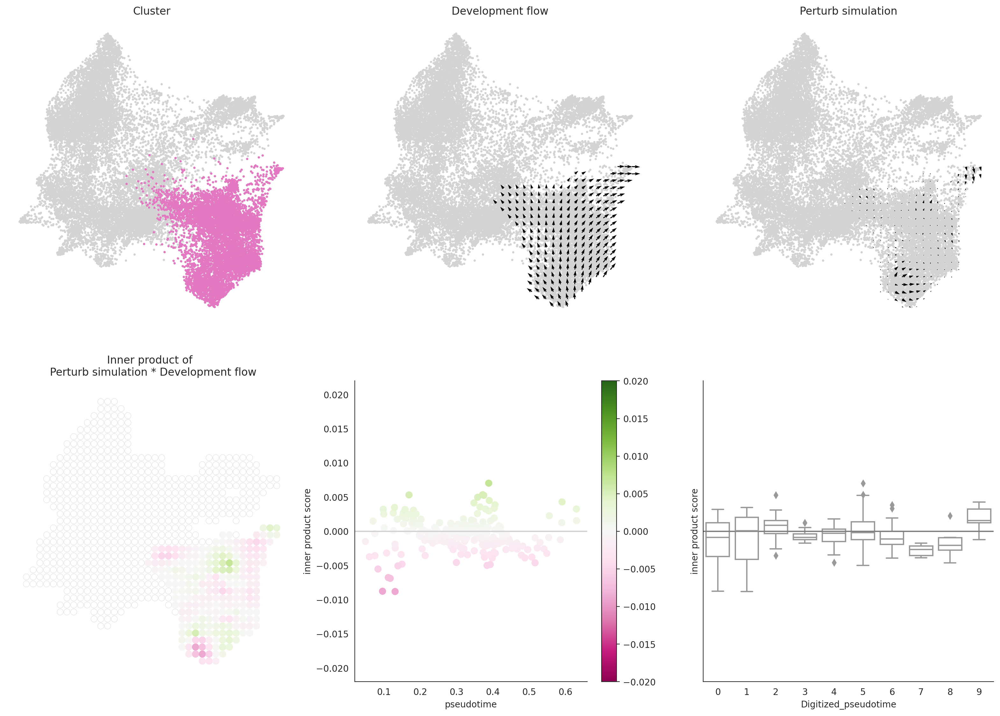

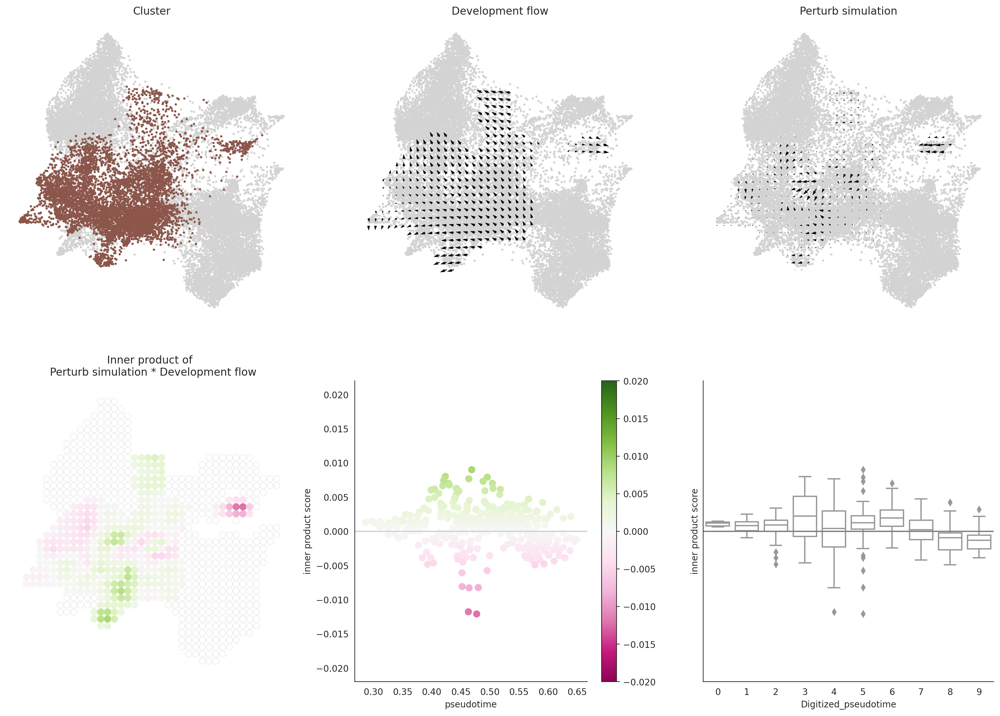

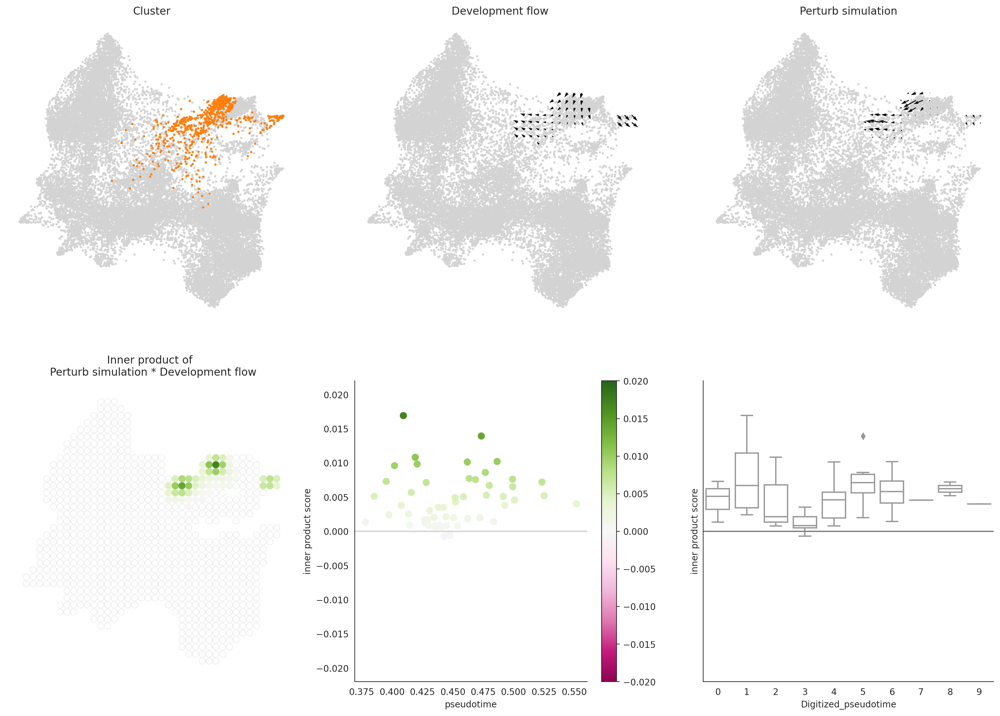

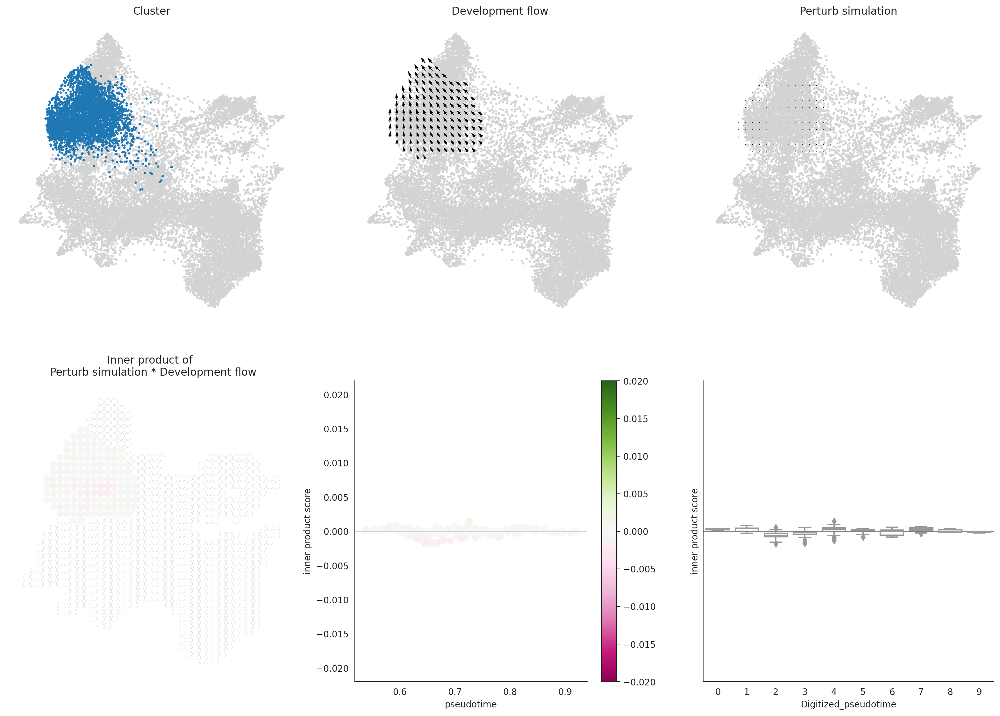

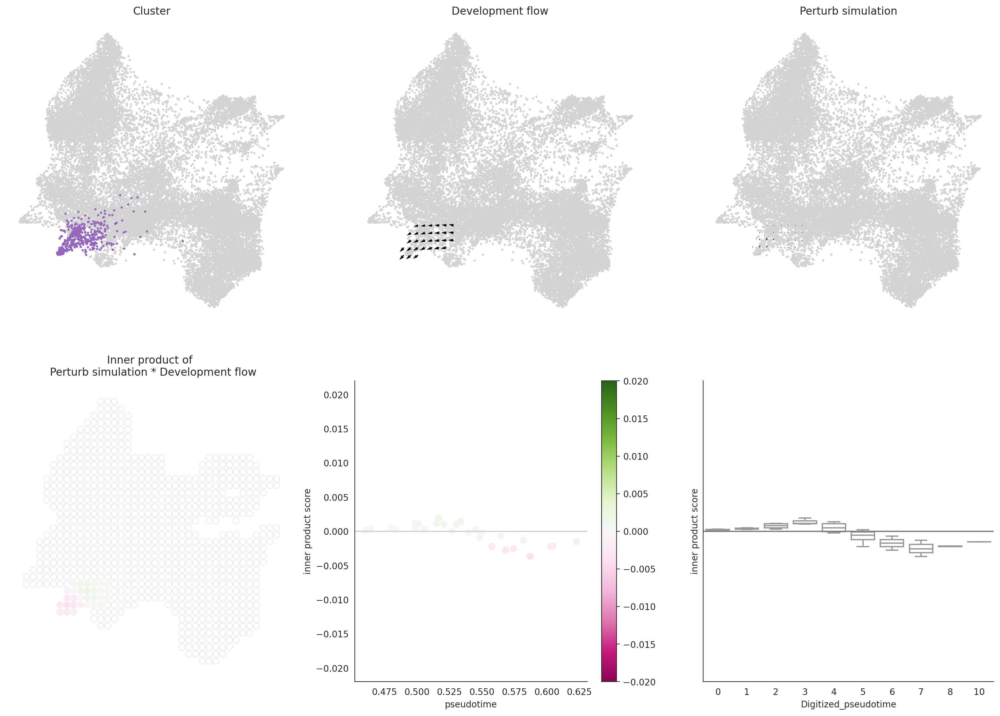

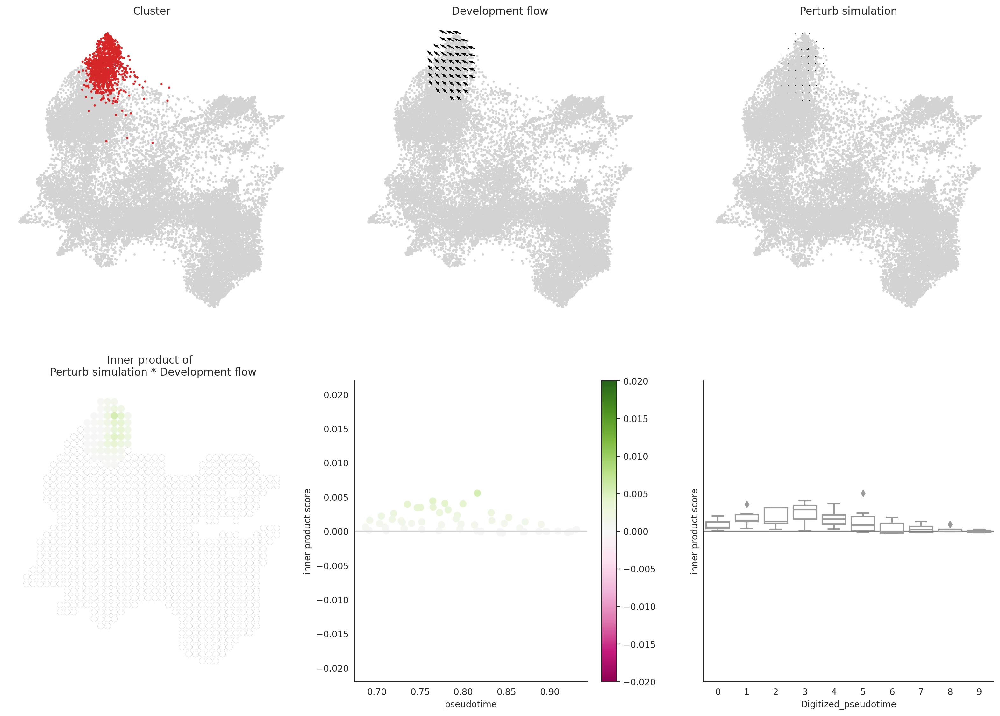

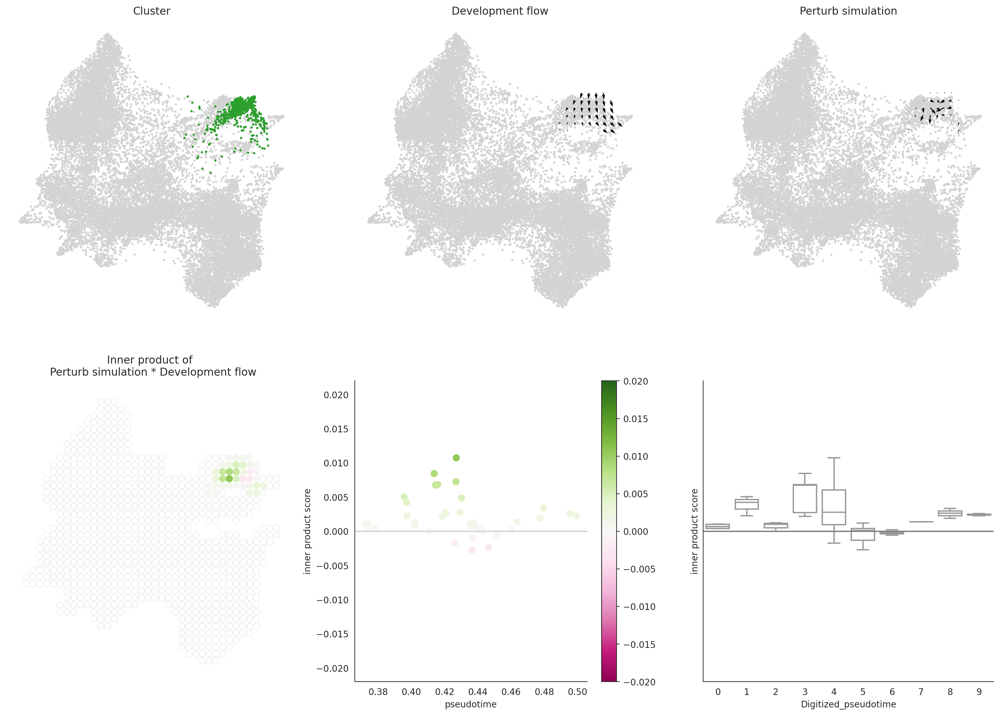

In [28]:
mean_perturbation_scores = {}

for grp in oracle.adata.obs[cluster_col].unique().tolist():
    # Get cell index list for the cells of interest
    clusters = [grp]
    cluster_col = cluster_col
    lineage_name = grp

    try:
        cell_idx = np.where(oracle.adata.obs[cluster_col].isin(clusters))[0]
    except Exception:
        log.exception(f"could not select cells for {grp}")

    try:
        dev = Oracle_development_module()

        # Load development flow
        dev.load_differentiation_reference_data(gradient_object = gradient)

        # Load simulation result
        dev.load_perturb_simulation_data(
            oracle_object = oracle,
            cell_idx_use = cell_idx, 
            name = lineage_name,
        )
    except Exception:
        log.exception(f"could not load data {grp}")

    try:
        # Calculation
        dev.calculate_inner_product()
        dev.calculate_digitized_ip(n_bins = 10)
    except Exception:
        log.exception(f"could not calculate PS {grp}")

    try:
        dev.visualize_development_module_layout_0(
            s = 5,
            scale_for_simulation = scale_simulation,
            s_grid = 50,
            scale_for_pseudotime = scale_dev,
            vm = vm,
        )
    except Exception:
        log.exception(f"could not plot {grp}")

    try:
        mean_perturbation_scores[grp] = dev.inner_product_df.score.mean()
    except Exception:
        log.exception(f"could not save PS {grp}")

In [31]:
ps_df = pd.DataFrame(mean_perturbation_scores, index=["PS"]).T

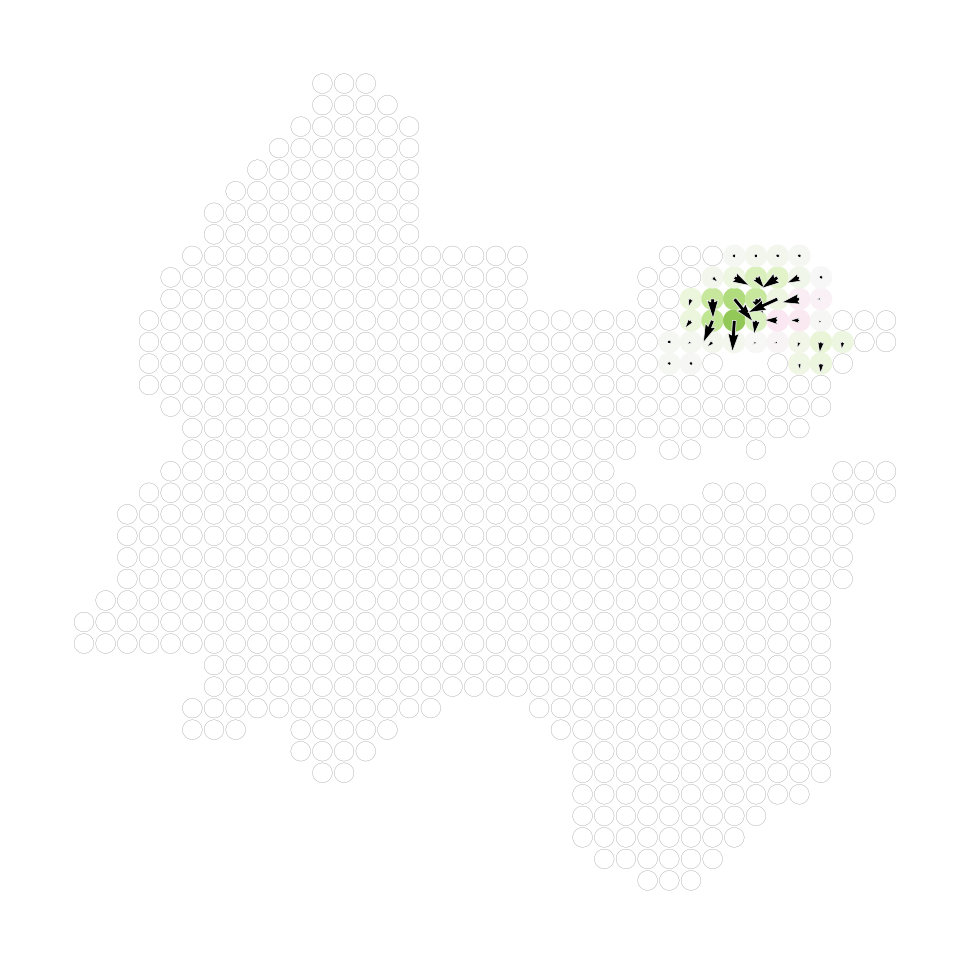

In [34]:
# Show perturbation scores with perturbation simulation vector field
fig, ax = plt.subplots(figsize=[6, 6])
dev.plot_inner_product_on_grid(vm = vm, s = 50, ax = ax)
dev.plot_simulation_flow_on_grid(scale = scale_simulation, show_background = False, ax = ax)

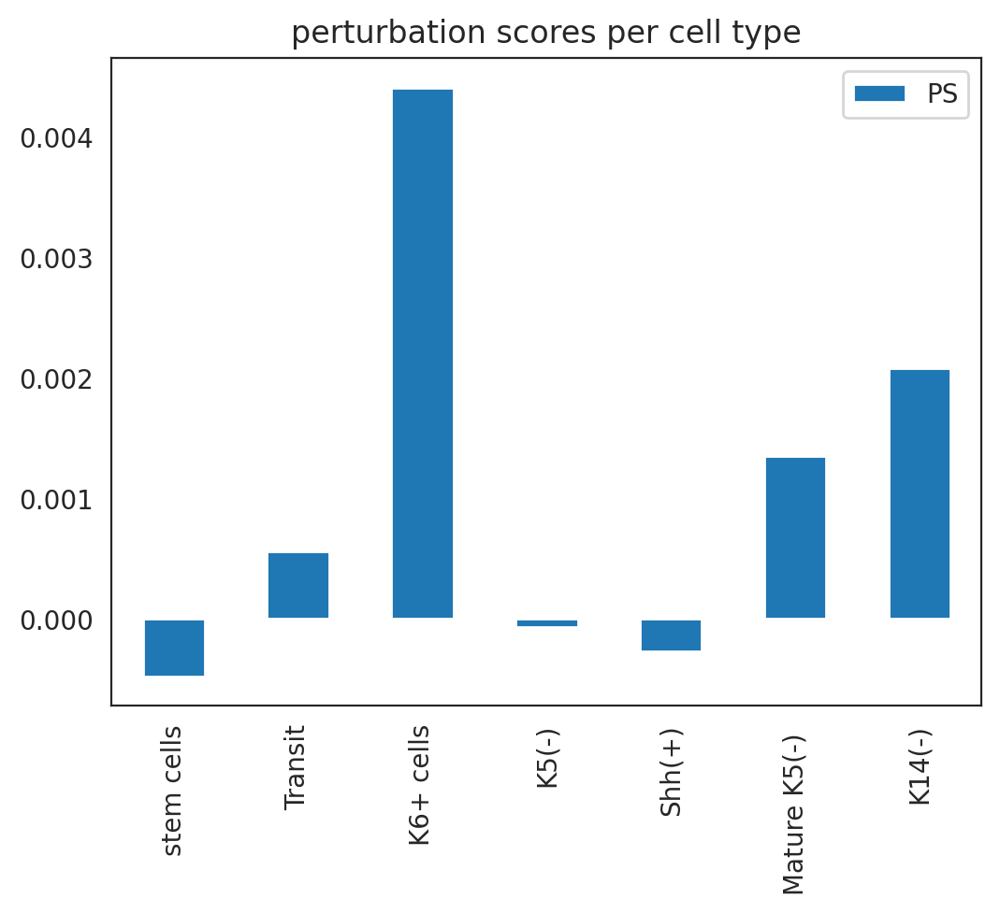

In [33]:
ps_df.plot.bar(title = "perturbation scores per cell type")
plt.savefig(f"../process/regulation/20250107_celloracle/20250107_pertubation_score/{goi}_celltype.pdf")
ps_df.to_csv("../process/regulation/20250107_celloracle/20250107_pertubation_score/Grhl1.csv")

In [39]:
def analyze_gene_perturbation(goi, oracle, gradient, cluster_col, vm=0.02, scale_simulation=0.5, scale_dev=40, output_dir="../process/regulation/20250107_celloracle"):
    """
    Analyze gene perturbation effects using CellOracle.
    
    Args:
        goi (str): Gene of interest
        oracle (CellOracle): CellOracle object
        gradient (object): Gradient object
        cluster_col (str): Column name for cell clusters
        vm (float): Visualization parameter for plotting
        scale_simulation (float): Scale parameter for simulation
        scale_dev (int): Scale parameter for development
        output_dir (str): Output directory path
    """
    try:
        # Create output directories if they don't exist
        perturbation_dir = f"{output_dir}/20250107_pertubation_score"
        os.makedirs(perturbation_dir, exist_ok=True)
        
        # Simulate perturbation
        oracle.simulate_shift(
            perturb_condition={goi: 0.0},
            n_propagation=3
        )
        
        # Calculate transition probability
        oracle.estimate_transition_prob(
            n_neighbors=200,
            knn_random=True,
            sampled_fraction=1
        )
        
        # Calculate embedding
        oracle.calculate_embedding_shift(sigma_corr=0.05)
        
        # Initialize development module
        dev = Oracle_development_module()
        
        # Load data
        dev.load_differentiation_reference_data(gradient_object=gradient)
        dev.load_perturb_simulation_data(oracle_object=oracle)
        
        # Calculate scores
        dev.calculate_inner_product()
        dev.calculate_digitized_ip(n_bins=10)
        
        # Plot overall perturbation
        fig, ax = plt.subplots(figsize=[6, 6])
        dev.plot_inner_product_on_grid(vm=vm, s=50, ax=ax)
        dev.plot_simulation_flow_on_grid(scale=scale_simulation, show_background=False, ax=ax)
        plt.savefig(f"{perturbation_dir}/{goi}_pertubation.pdf")
        plt.close()
        
        # Calculate per-cluster scores
        mean_perturbation_scores = {}
        
        for grp in oracle.adata.obs[cluster_col].unique().tolist():
            try:
                # Get cell indices
                cell_idx = np.where(oracle.adata.obs[cluster_col].isin([grp]))[0]
                
                # Initialize new development module
                dev_cluster = Oracle_development_module()
                
                # Load data for cluster
                dev_cluster.load_differentiation_reference_data(gradient_object=gradient)
                dev_cluster.load_perturb_simulation_data(
                    oracle_object=oracle,
                    cell_idx_use=cell_idx,
                    name=grp
                )
                
                # Calculate scores
                dev_cluster.calculate_inner_product()
                dev_cluster.calculate_digitized_ip(n_bins=10)
                
                # Visualize
                dev_cluster.visualize_development_module_layout_0(
                    s=5,
                    scale_for_simulation=scale_simulation,
                    s_grid=50,
                    scale_for_pseudotime=scale_dev,
                    vm=vm
                )
                
                # Store mean score
                mean_perturbation_scores[grp] = dev_cluster.inner_product_df.score.mean()
                
            except Exception as e:
                log.exception(f"Error processing cluster {grp}: {str(e)}")
        
        # Create and save results
        ps_df = pd.DataFrame(mean_perturbation_scores, index=["PS"]).T
        
        # Plot cell type scores
        plt.figure(figsize=[8, 6])
        ps_df.plot.bar(title=f"Perturbation scores per cell type - {goi}")
        plt.tight_layout()
        plt.savefig(f"{perturbation_dir}/{goi}_celltype.pdf")
        plt.close()
        
        # Save scores to CSV
        ps_df.to_csv(f"{perturbation_dir}/{goi}.csv")
        
        return ps_df
        
    except Exception as e:
        log.exception(f"Error analyzing perturbation for {goi}: {str(e)}")
        return None


In [42]:
TF_list = pd.read_csv("../process/regulation/20250107_celloracle/20250107_TF1.csv",index_col=0)

In [46]:
TF_list = TF_list["0"]

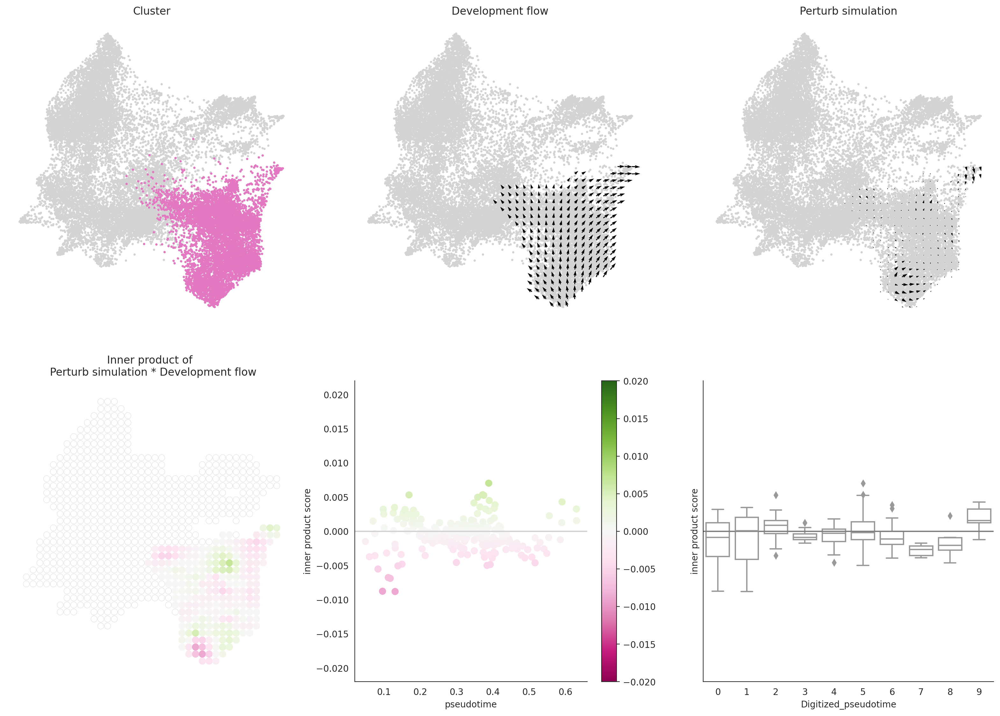

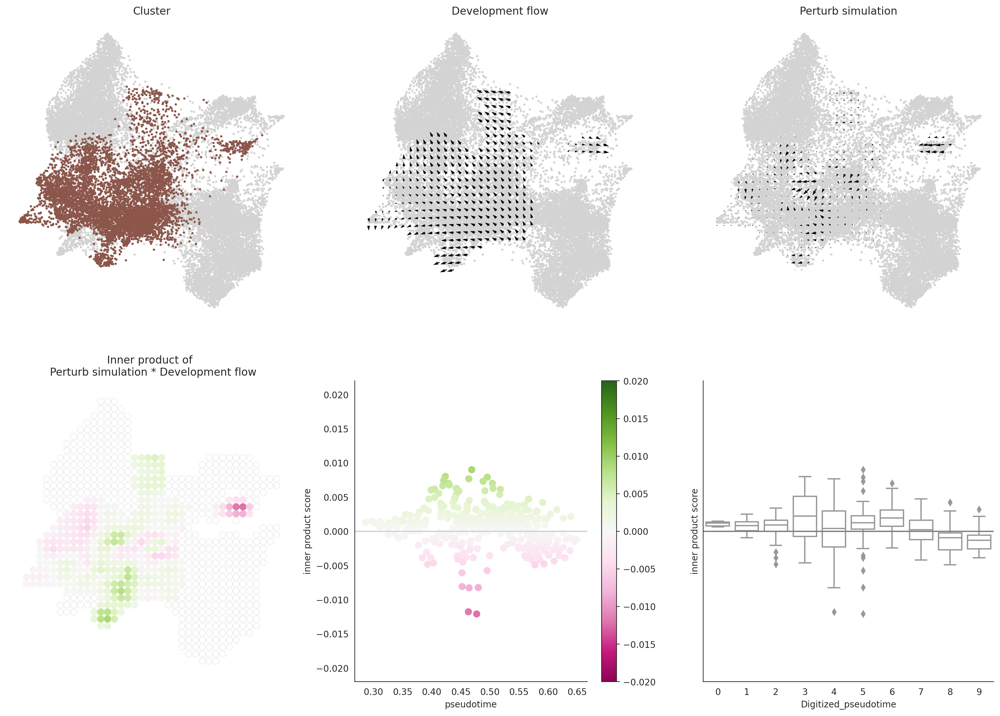

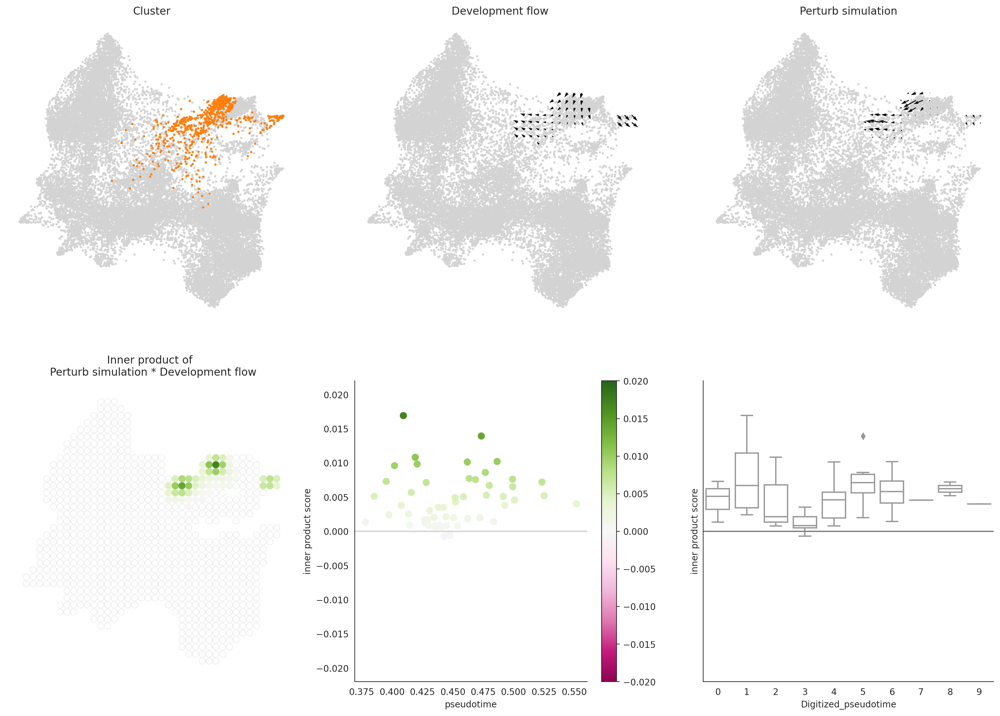

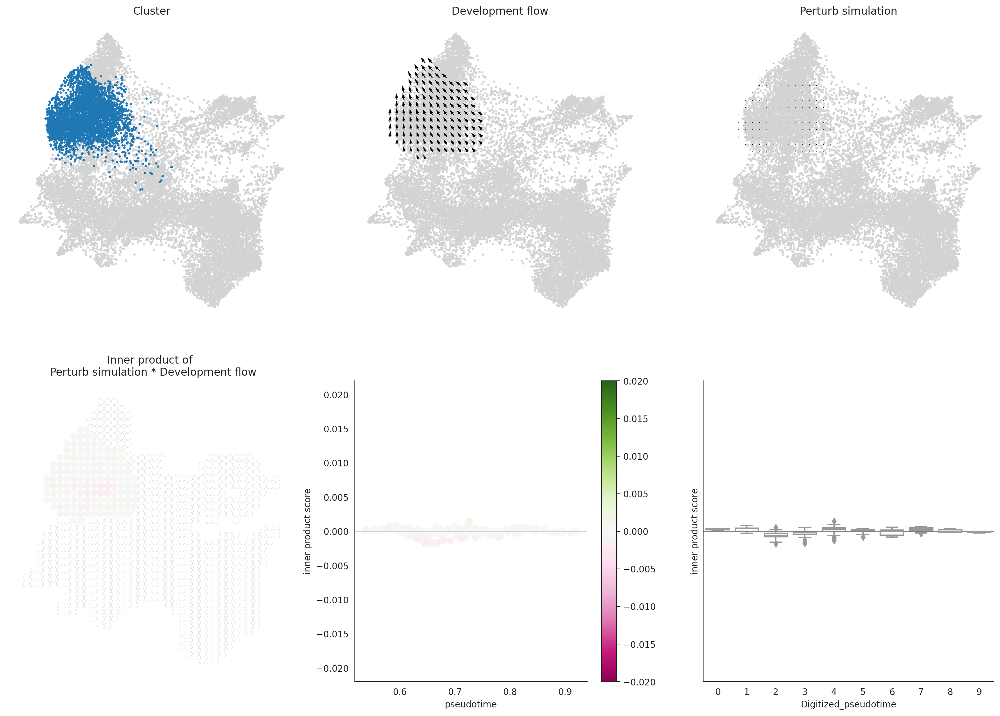

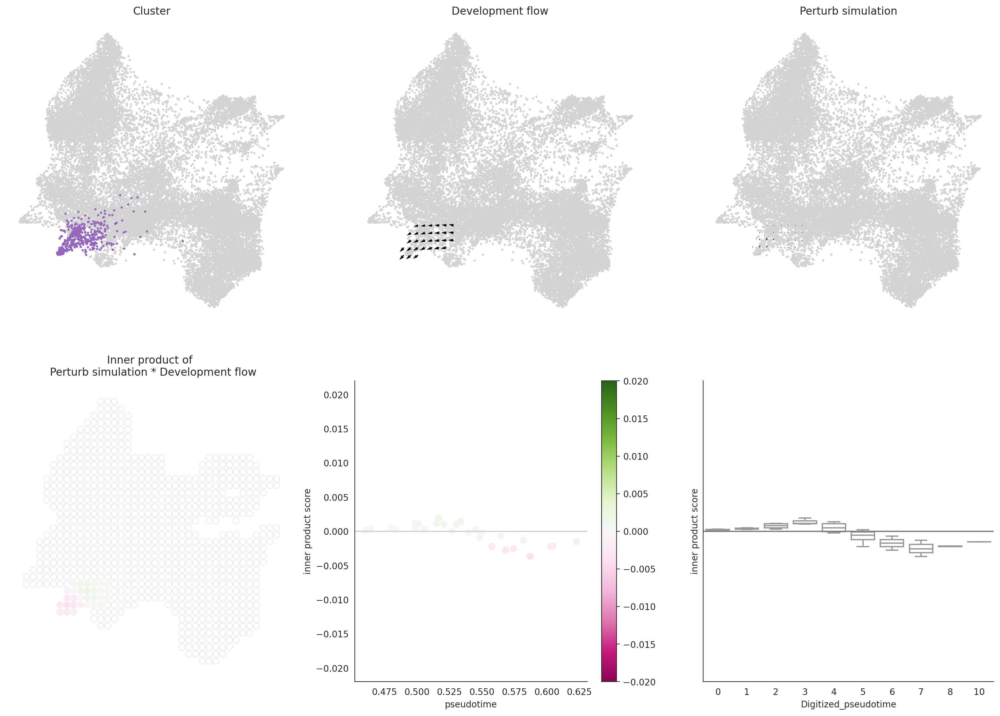

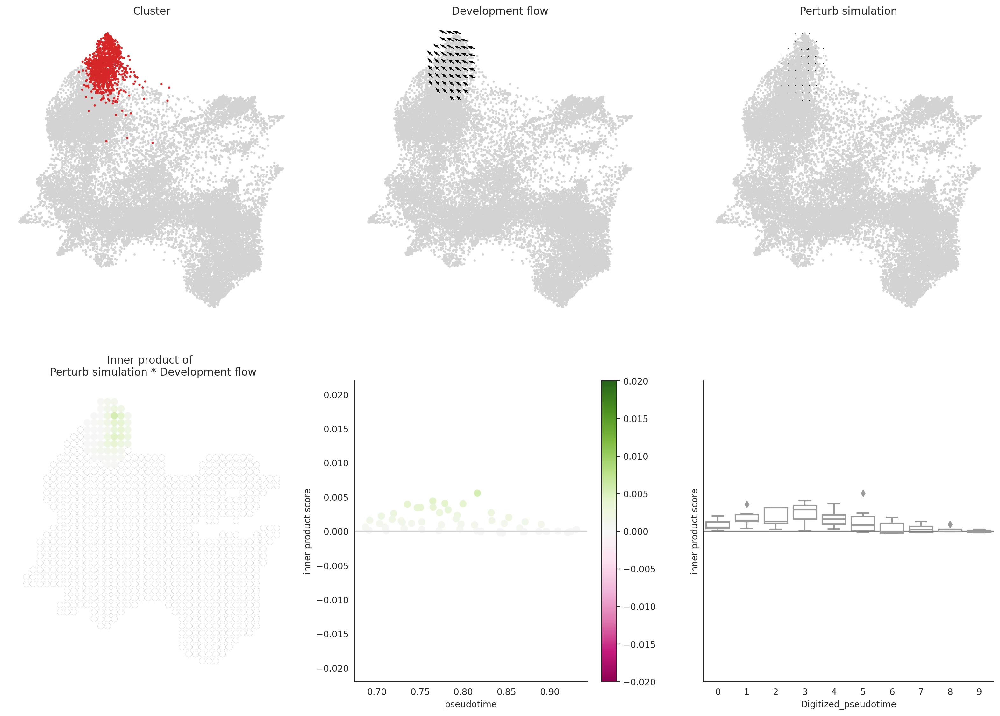

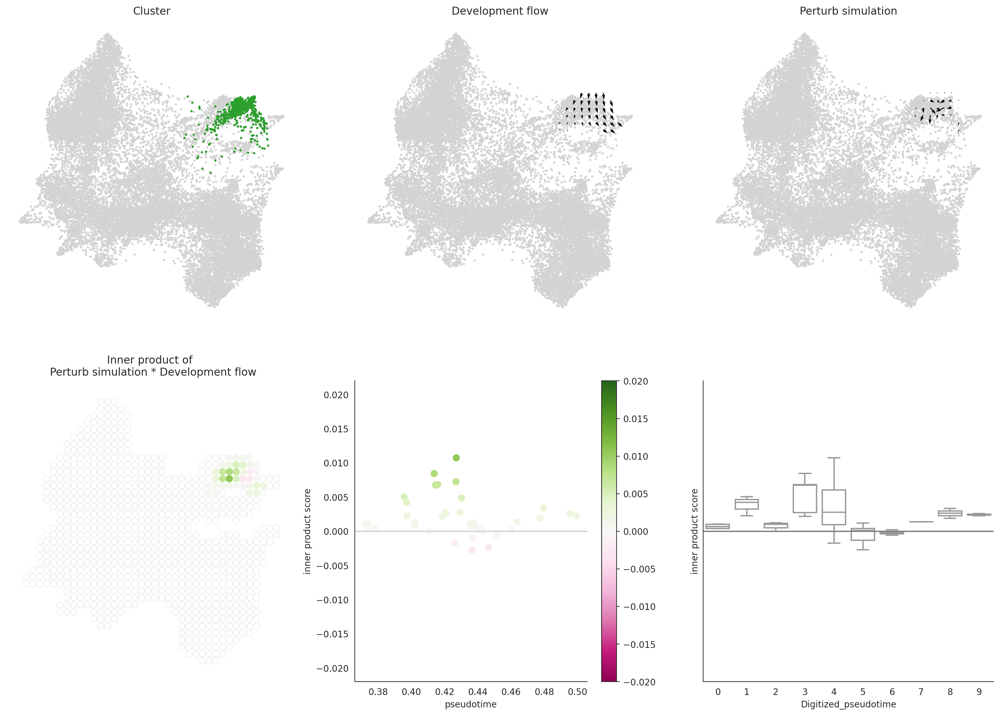

<Figure size 800x600 with 0 Axes>

In [37]:
df_test = analyze_gene_perturbation(goi= goi,oracle=oracle,gradient=gradient,cluster_col="level1_anno")

In [48]:
def read_all_csv_files(directory_path):
    """
    Read all CSV files from a directory into a dictionary of DataFrames.
    
    Args:
        directory_path (str): Path to directory containing CSV files
        
    Returns:
        dict: Dictionary with filenames as keys and DataFrames as values
    """
    try:
        # Convert to Path object for better path handling
        directory = Path(directory_path)
        
        # Check if directory exists
        if not directory.exists():
            raise FileNotFoundError(f"Directory not found: {directory_path}")
            
        # Dictionary to store results
        csv_data = {}
        
        # List all CSV files
        csv_files = list(directory.glob("*.csv"))
        
        if not csv_files:
            print(f"No CSV files found in {directory_path}")
            return {}
            
        # Read each CSV file
        for file_path in csv_files:
            try:
                # Get filename without extension as key
                file_key = file_path.stem
                
                # Read CSV file
                df = pd.read_csv(file_path)
                
                # Store in dictionary
                csv_data[file_key] = df
                
                print(f"Successfully read: {file_path.name}")
                
            except Exception as e:
                print(f"Error reading {file_path.name}: {str(e)}")
                continue
                
        # Print summary
        print(f"\nTotal files read: {len(csv_data)}/{len(csv_files)}")
        
        return csv_data
        
    except Exception as e:
        print(f"Error processing directory: {str(e)}")
        return {}


In [ ]:
for i in TF_list:
    df_test = analyze_gene_perturbation(goi= i,oracle=oracle,gradient=gradient,cluster_col="level1_anno")

In [51]:
csvFile = read_all_csv_files("../process/regulation/20250107_celloracle/20250107_pertubation_score/")

Successfully read: Klf4.csv
Successfully read: Fos.csv
Successfully read: Pou3f1.csv
Successfully read: Hes1.csv
Successfully read: Nfe2l2.csv
Successfully read: Klf13.csv
Successfully read: Grhl3.csv
Successfully read: Mafb.csv
Successfully read: Zbtb20.csv
Successfully read: Ikzf2.csv
Successfully read: Churc1.csv
Successfully read: Otx1.csv
Successfully read: Hes6.csv
Successfully read: Atf3.csv
Successfully read: Scmh1.csv
Successfully read: Meis2.csv
Successfully read: Plagl1.csv
Successfully read: Ahr.csv
Successfully read: Sox5.csv
Successfully read: Klf12.csv
Successfully read: Klf9.csv
Successfully read: Sox2.csv
Successfully read: Runx2.csv
Successfully read: Irx2.csv
Successfully read: Fosl2.csv
Successfully read: Etv4.csv
Successfully read: Maf.csv
Successfully read: Foxq1.csv
Successfully read: Sox4.csv
Successfully read: Barx1.csv
Successfully read: Sox21.csv
Successfully read: Foxe1.csv
Successfully read: Klf5.csv
Successfully read: Barx2.csv
Successfully read: Sox6.csv
